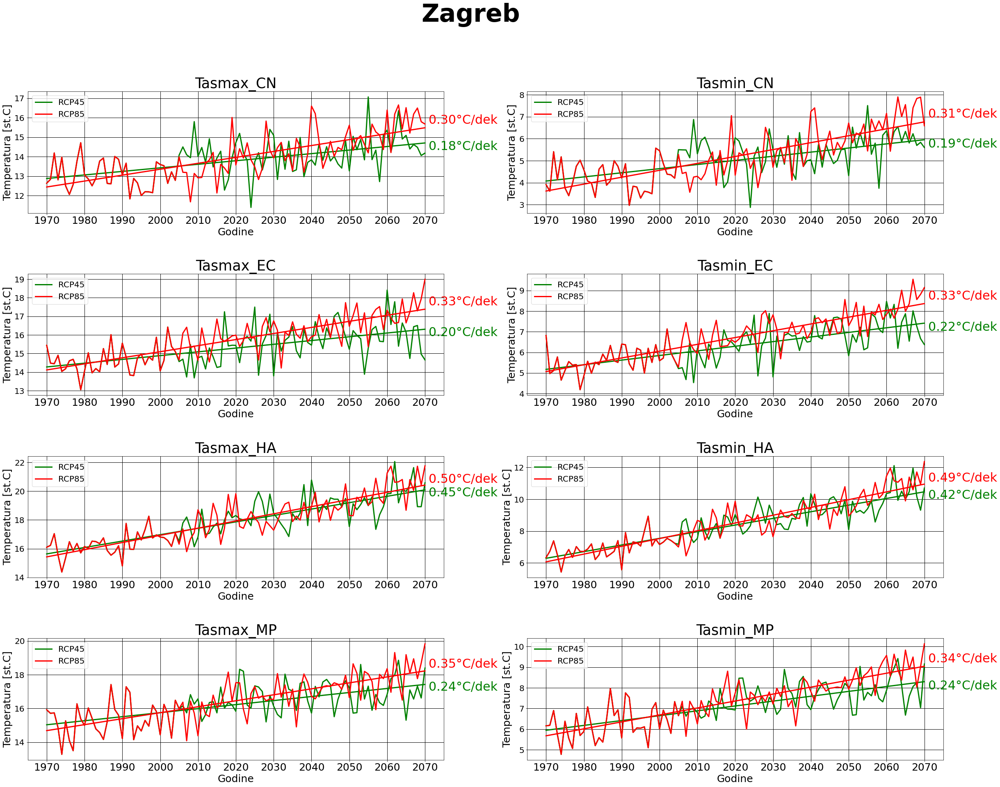

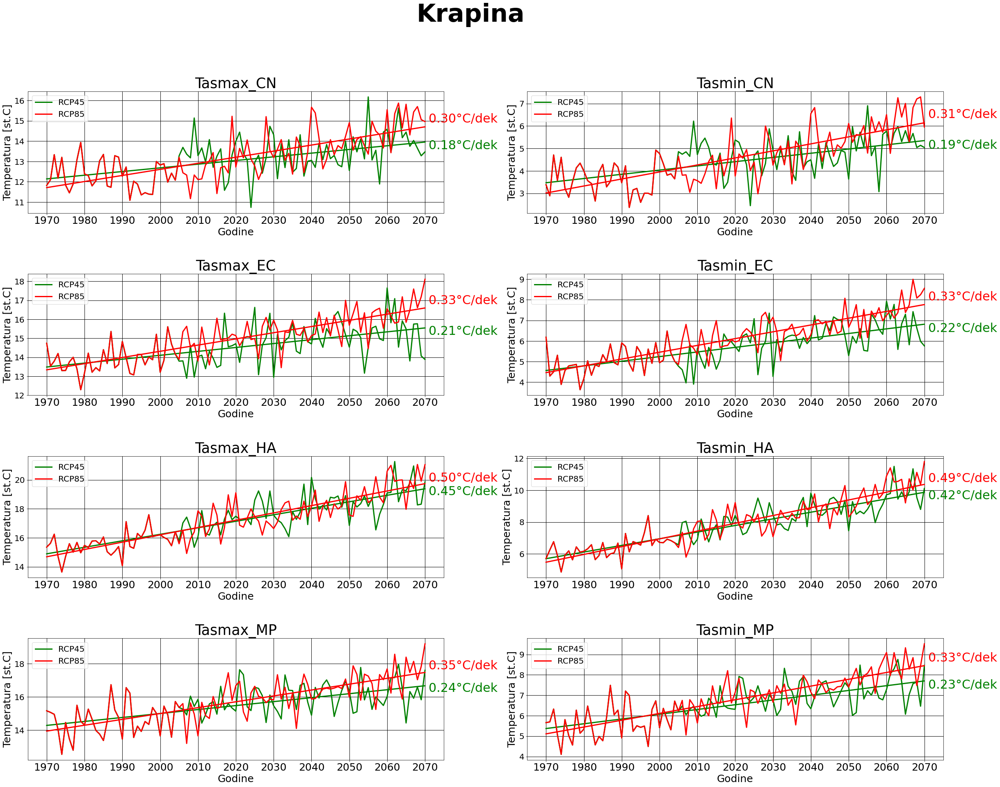

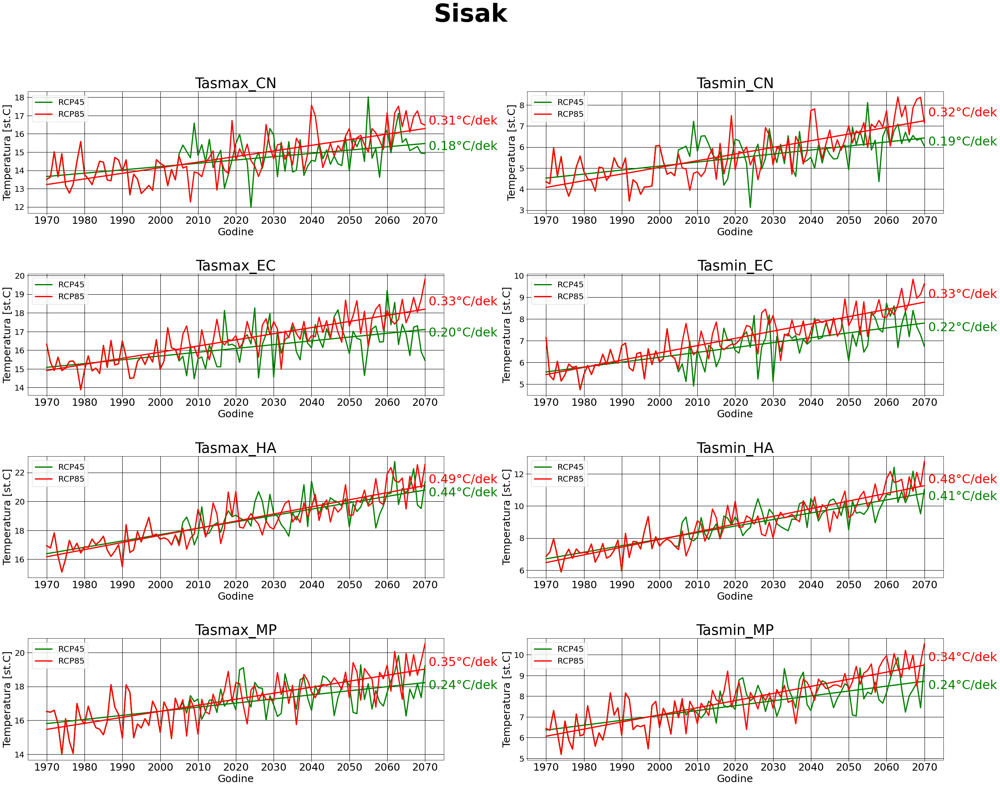

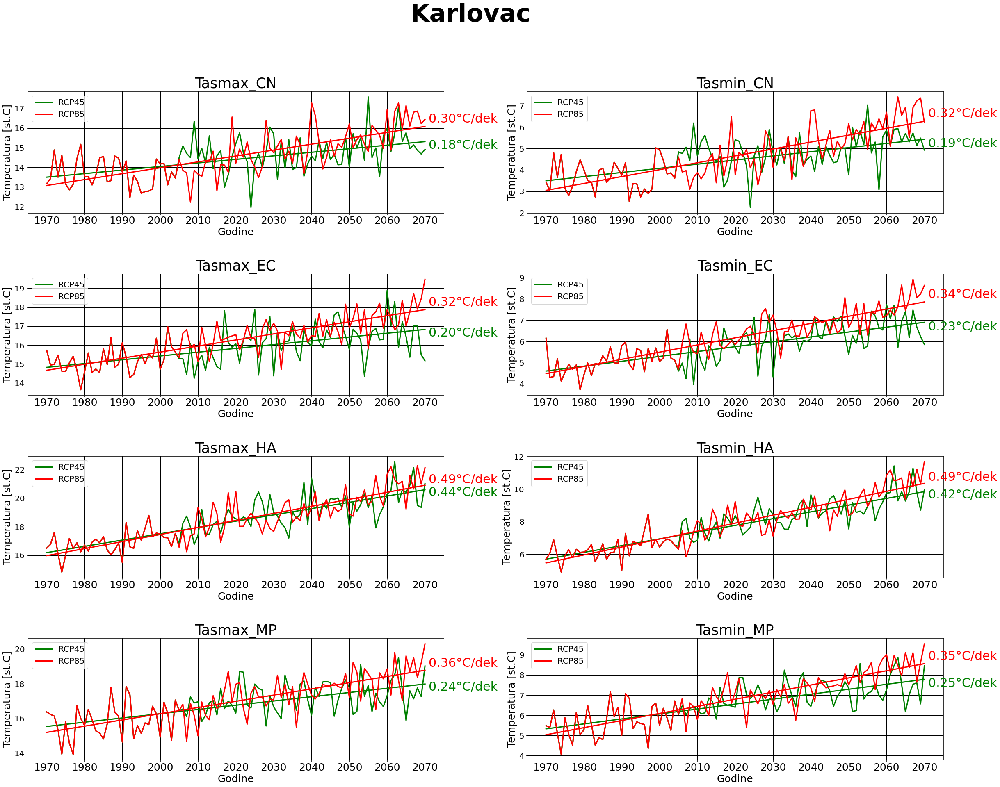

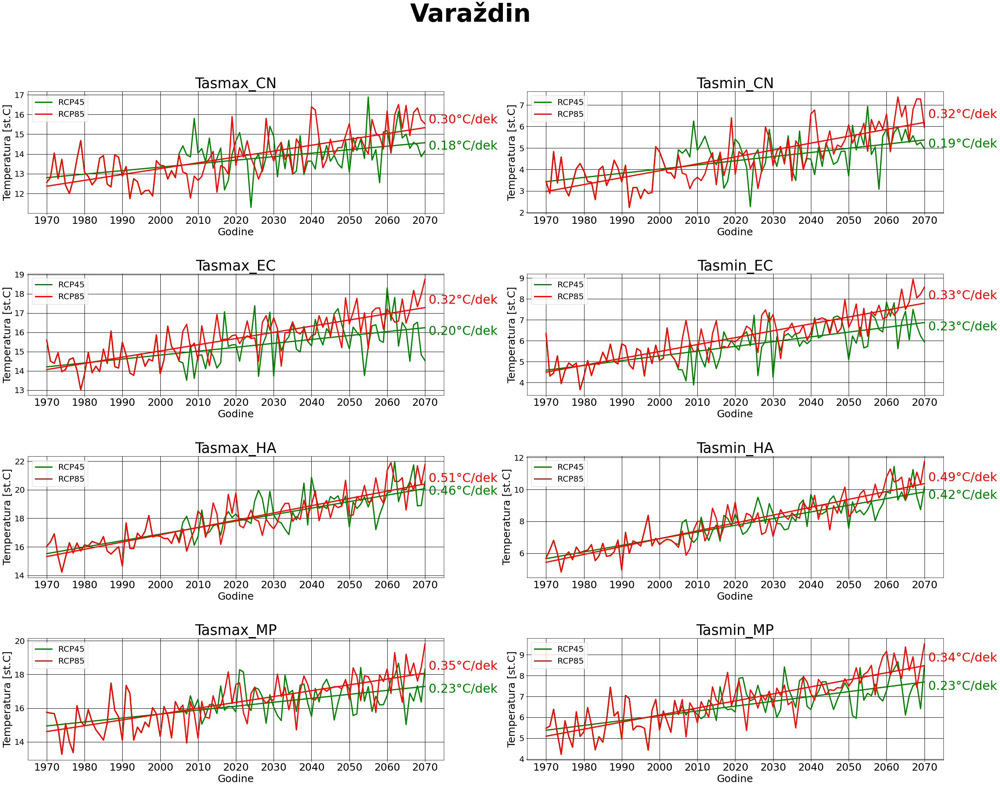

...

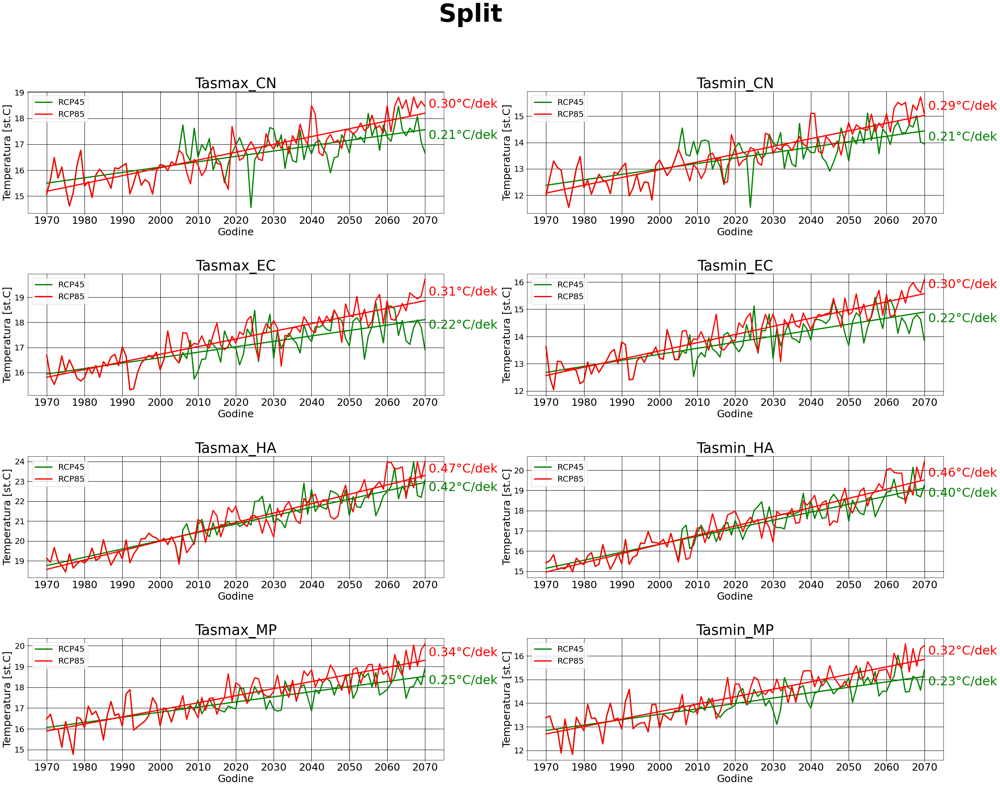

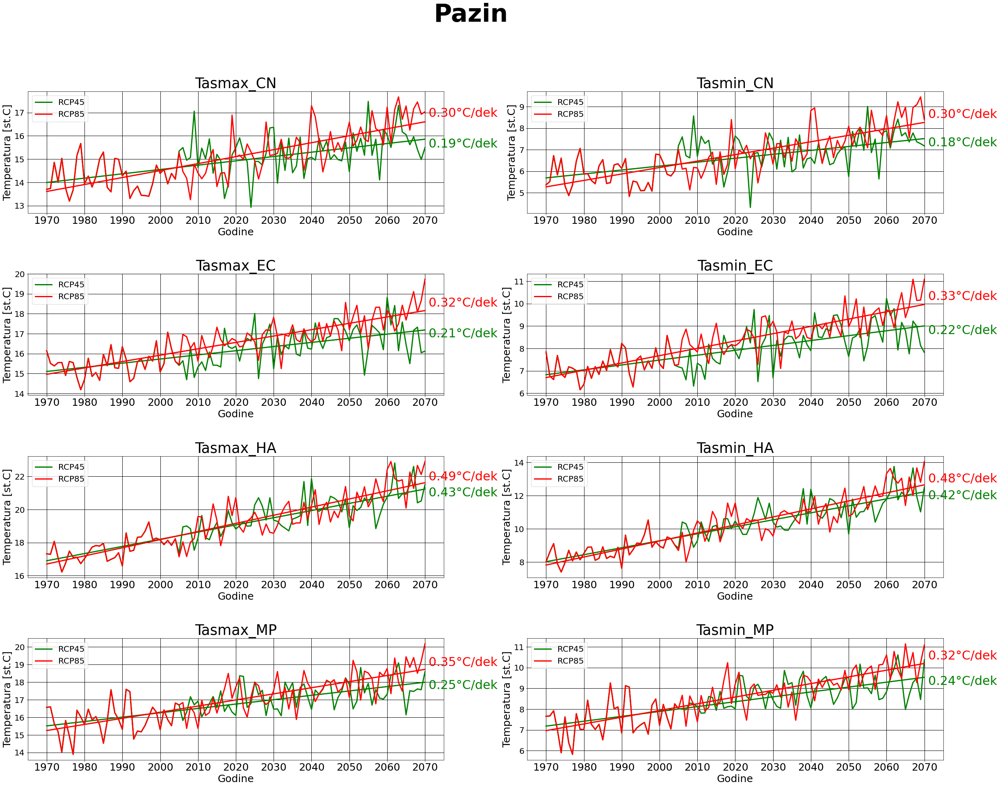

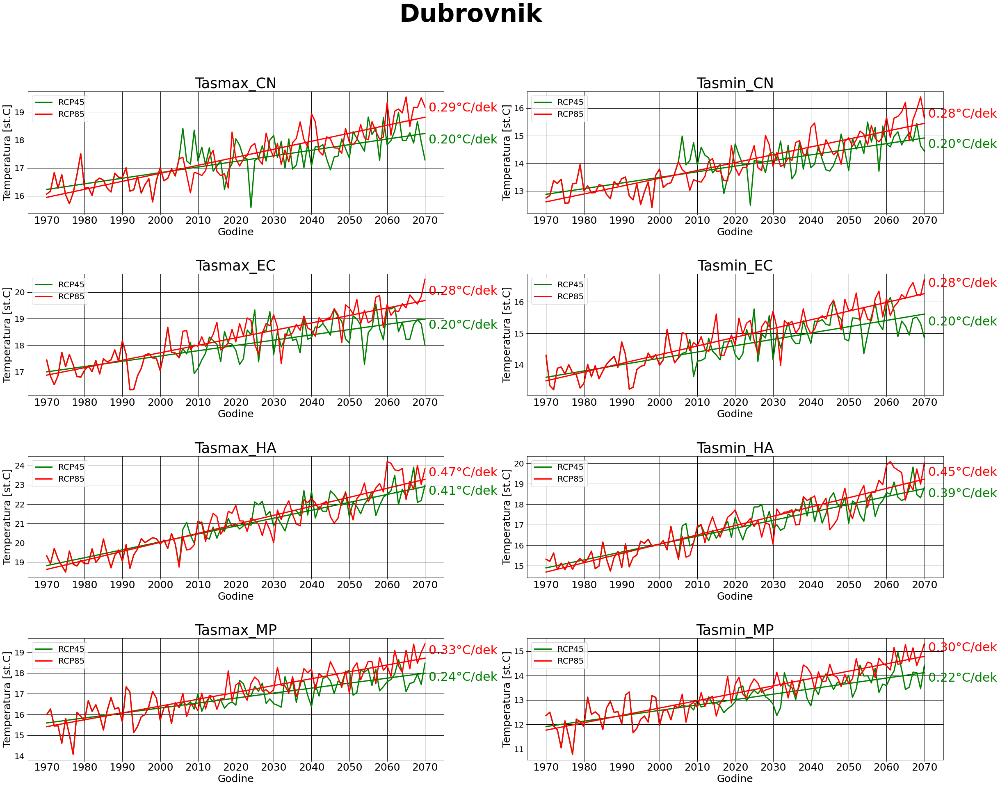

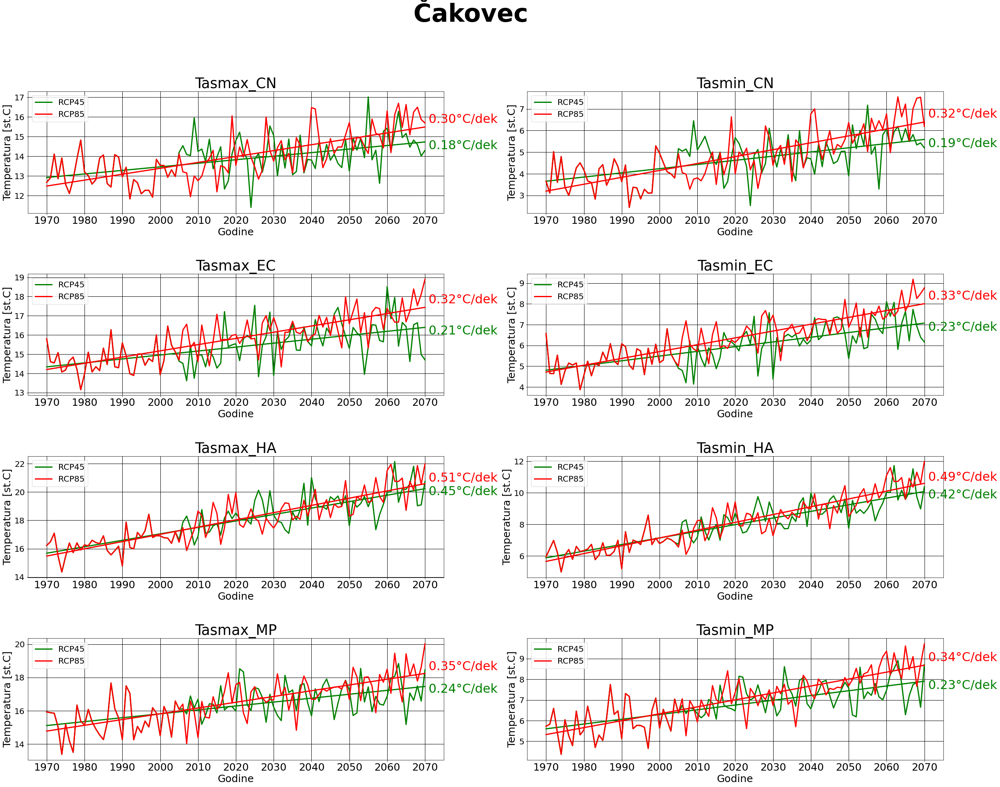

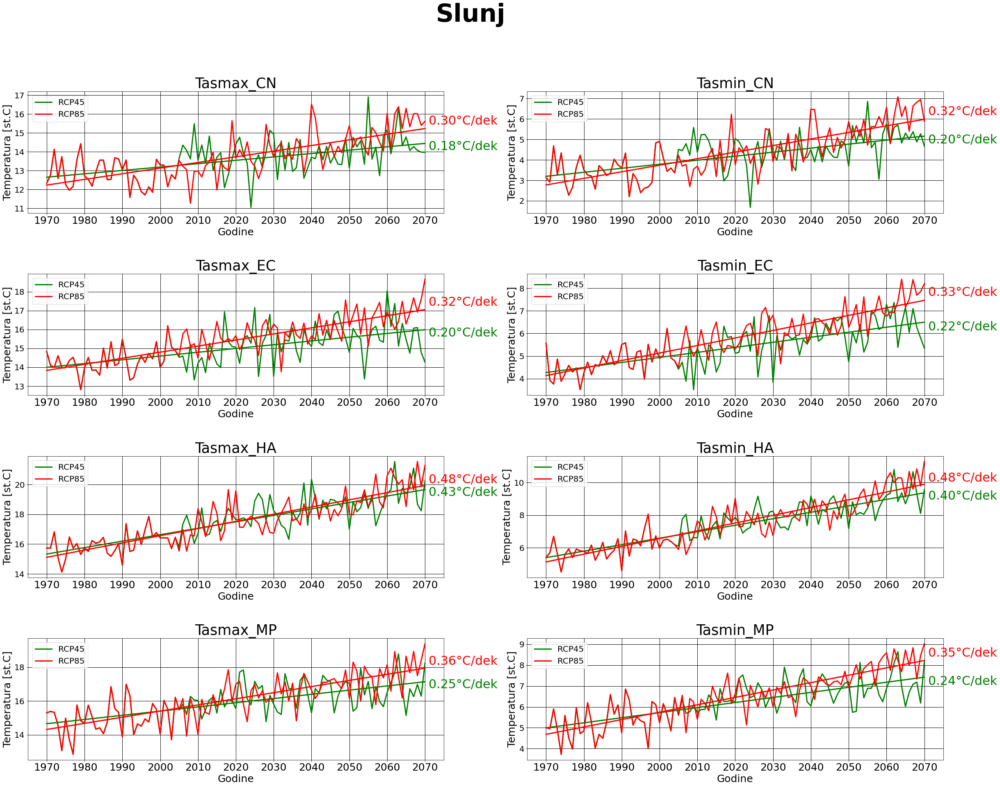

In [1]:
#kod za čitanje Netcdf=Network common data form
from netCDF4 import Dataset
import numpy as np
import numpy.ma as ma # MaskedArray
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy.linalg as LA

# crtanje historijske (01.01.1971.-31.12.2000.), RCP4.5 i RCP8.5 (01.01.2041.-31.12.2070.) 
# scenarija za svaku lokaciju i za svaki GCM model zasebno

plt.close('all')

#Funkcije

def lin_reg(temp,godine):
    X = godine - godine.mean()
    y = temp - temp.mean()
    cxy=X.T.dot(y)
    cxx=X.T.dot(X)
    a=LA.solve(cxx,cxy)
    fit=X.dot(a)
    b = temp.mean()-a*godine.mean()
    #ep = pogreška, odstupanje fita od y 
    ep=y-fit
    # r2 = koeficijent korelacije
    r2=1-np.var(ep)/np.var(y)
    return r2,a,b,fit

def Ucitavanje (GC,RC,ts,G):
    file = '{}_{}_{}_GRAD_{}_P0_P2_yearmean.nc'.format(GC,RC,ts,G)
    fi = Dataset(file, mode='r')
    t = (fi.variables[ts][:].T).tolist()
    tm = [i for i in range(0,101)]
    for i in range (0,101):
        tm[i] = t[0][0][0][i]
    npa = np.asarray(tm).reshape(101,1)
    return tm,npa


def Crtanje (afir,bfir,asec,bsec,tm45,tm85,title,b):
    time = [i for i in range(1,102)];
    timenp = np.asarray(time).reshape(101,1)
    
    ax[b].plot(time,tm45,'g',label='RCP45',linewidth=3)
    ax[b].plot(timenp,timenp * afir + bfir,'g',linewidth=3)
    ax[b].text(time[100]+1,timenp[97] * afir + bfir-0.3,'{0:0.2f}°C/dek'.format(afir[0,0]*10),fontsize=30,color='g')
    
    ax[b].plot(time,tm85,'r',label='RCP85',linewidth=3)
    ax[b].plot(timenp,timenp * asec + bsec,'r',linewidth=3)
    ax[b].text(time[100]+1,timenp[97] * asec + bsec+0.3,'{0:0.2f}°C/dek'.format(asec[0,0]*10),fontsize=30,color='r')
    
    xTicks = np.arange(1,102,10)
    xTickLabels = np.arange(1970,2071,10)
        
        
    ax[b].grid(linestyle='-', linewidth='1', color='k');
    ax[b].set_title(title,fontsize=35)
    ax[b].set_xlabel('Godine',fontsize=25)
    ax[b].set_ylabel('Temperatura [st.C]',fontsize=25)
    ax[b].set_xticks(xTicks)
    ax[b].set_xticklabels(xTickLabels,fontsize = 25)
    ax[b].tick_params(axis='y', labelsize=20)
    handles, labels = ax[b].get_legend_handles_labels()
    ax[b].legend(handles[::-1], labels[::-1])
    ax[b].legend(prop=dict(size=20))
    


    


Gr=[i for i in range(0,22)]
Gr[1]='Zagreb'; #
Gr[2]='Krapina'; 
Gr[3]='Sisak'; #
Gr[4]='Karlovac';
Gr[5]='Varaždin'; #
Gr[6]='Koprivnica';
Gr[7]='Bjelovar';
Gr[8]='Rijeka'; #
Gr[9]='Gospić'; #
Gr[10]='Virovitica';
Gr[11]='Požega';
Gr[12]='Slavonski Brod'; #
Gr[13]='Zadar'; #
Gr[14]='Osijek'; #
Gr[15]='Šibenik';
Gr[16]='Vukovar';
Gr[17]='Split'; #
Gr[18]='Pazin'; #
Gr[19]='Dubrovnik'; #
Gr[20]='Čakovec';
Gr[21]='Slunj';


GCM = ['CN', 'EC', 'HA', 'MP']
tas = ['tasmax','tasmin']
RCP = ['RCP45', 'RCP85']
Grad = ['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21']
time = [i for i in range(1,102)]
timenp = np.asarray(time).reshape(101,1)
a = 1 #brojac
b = 0 #brojac
for G in Grad:
    
    CNtmax45,CNtmax45np = Ucitavanje(GCM[0],RCP[0],tas[0],G)
    r2, a1, b1, fit1 = lin_reg(CNtmax45np,timenp)
    CNtmax85,CNtmax85np = Ucitavanje(GCM[0],RCP[1],tas[0],G)
    r2, a2, b2, fit2 = lin_reg(CNtmax85np,timenp)
    
    CNtmin45,CNtmin45np = Ucitavanje(GCM[0],RCP[0],tas[1],G)
    r2, a3, b3, fit3 = lin_reg(CNtmin45np,timenp)
    CNtmin85,CNtmin85np = Ucitavanje(GCM[0],RCP[1],tas[1],G)
    r2, a4, b4, fit4 = lin_reg(CNtmin85np,timenp)
    
    
    ECtmax45,ECtmax45np = Ucitavanje(GCM[1],RCP[0],tas[0],G)
    r2, a5, b5, fit5 = lin_reg(ECtmax45np,timenp)
    ECtmax85,ECtmax85np = Ucitavanje(GCM[1],RCP[1],tas[0],G)
    r2, a6, b6, fit6 = lin_reg(ECtmax85np,timenp)
    
    ECtmin45,ECtmin45np = Ucitavanje(GCM[1],RCP[0],tas[1],G)
    r2, a7, b7, fit7 = lin_reg(ECtmin45np,timenp)
    ECtmin85,ECtmin85np = Ucitavanje(GCM[1],RCP[1],tas[1],G)
    r2, a8, b8, fit8 = lin_reg(ECtmin85np,timenp)
    
    
    HAtmax45,HAtmax45np = Ucitavanje(GCM[2],RCP[0],tas[0],G)
    r2, a9, b9, fit9 = lin_reg(HAtmax45np,timenp)
    HAtmax85,HAtmax85np = Ucitavanje(GCM[2],RCP[1],tas[0],G)
    r2, a10, b10, fit10 = lin_reg(HAtmax85np,timenp)
    
    HAtmin45,HAtmin45np = Ucitavanje(GCM[2],RCP[0],tas[1],G)
    r2, a11, b11, fit11 = lin_reg(HAtmin45np,timenp)
    HAtmin85,HAtmin85np = Ucitavanje(GCM[2],RCP[1],tas[1],G)
    r2, a12, b12, fit12 = lin_reg(HAtmin85np,timenp)
    
    
    MPtmax45,MPtmax45np = Ucitavanje(GCM[3],RCP[0],tas[0],G)
    r2, a13, b13, fit13 = lin_reg(MPtmax45np,timenp)
    MPtmax85,MPtmax85np = Ucitavanje(GCM[3],RCP[1],tas[0],G)
    r2, a14, b14, fit14 = lin_reg(MPtmax85np,timenp)
    
    MPtmin45,MPtmin45np = Ucitavanje(GCM[3],RCP[0],tas[1],G)
    r2, a15, b15, fit15 = lin_reg(MPtmin45np,timenp)
    MPtmin85,MPtmin85np = Ucitavanje(GCM[3],RCP[1],tas[1],G)
    r2, a16, b16, fit16 = lin_reg(MPtmin85np,timenp)
    
    #računanje linearne regeresije za svaki 100godišnji hod temperature:
    
    
    
    
    fig, ax = plt.subplots(4,2,figsize=(40,30))
    fig.suptitle(Gr[a], fontsize=60, fontweight='bold')
    ax = ax.flatten()
    plt.subplots_adjust(hspace = 0.5)
        
        
    Crtanje(a1,b1,a2,b2,CNtmax45,CNtmax85,'Tasmax_CN',0)
    Crtanje(a3,b3,a4,b4,CNtmin45,CNtmin85,'Tasmin_CN',1)
    
    Crtanje(a5,b5,a6,b6,ECtmax45,ECtmax85,'Tasmax_EC',2)
    Crtanje(a7,b7,a8,b8,ECtmin45,ECtmin85,'Tasmin_EC',3)
    
    Crtanje(a9,b9,a10,b10,HAtmax45,HAtmax85,'Tasmax_HA',4)
    Crtanje(a11,b11,a12,b12,HAtmin45,HAtmin85,'Tasmin_HA',5)
    
    Crtanje(a13,b13,a14,b14,MPtmax45,MPtmax85,'Tasmax_MP',6)
    Crtanje(a15,b15,a16,b16,MPtmin45,MPtmin85,'Tasmin_MP',7)
    
    
    
    plt.savefig("{}.png".format(Gr[a]))
    a += 1


    plt.show()